<a href="https://colab.research.google.com/github/ucheetah/exoplanet-viz-cluster/blob/main/research/NASA_exoplanets.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **NASA Exoplanet Data Analysis**

This notebook is for # **NASA Exoplanet Data Analysis**. It covers the upload, analysis and processing of NASA exoplanet data, performance of k-means clustering and generation of visualizations. The bulk of my analysis and final graphs are on my website:

*   [Worlds Beyond - Visualizing and Clustering NASA Exoplanet Data](https://ucheetah.github.io/exo-viz-cluster/)

# **1. Drive upload and packages**

**Drive upload**

In [77]:
from google.colab import drive, files
drive.mount('/content/gdrive/', force_remount=True)

Mounted at /content/gdrive/


In [78]:
!cp /content/gdrive/My\ Drive/exoplanet_functions.py .

**Imports**

In [79]:
import pandas as pd
import numpy as np
import requests
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.patches as mpatches
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import exoplanet_functions
from exoplanet_functions import load_data, rename_columns, perform_kmeans, return_describe_table

pd.options.mode.copy_on_write = True

 I've imported a matplotlib stylesheet that I've personalized on the [dark_background](https://matplotlib.org/stable/gallery/style_sheets/dark_background.html) stylesheet. Sheet code can be found at [exoplanet_dark_background.mplstyle](https://github.com/ucheetah/exoplanet-viz-cluster/blob/85373ae0570f29821916d55ad1a52b39da345aed/exoplanet_dark_background.mplstyle).

In [80]:
matplotlib.style.use('/content/gdrive/MyDrive/exoplanet_dark_background.mplstyle')

Bad key figure.format in file /content/gdrive/MyDrive/exoplanet_dark_background.mplstyle, line 7 ('figure.format: svg')
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.7.1/matplotlibrc.template
or from the matplotlib source distribution


**Variable definition**

Some of these uploads are more thoroughly explained in the EDA and K-means sections.

In [81]:
nasa_url = "https://exoplanetarchive.ipac.caltech.edu/TAP/sync?query=select+pl_name,sy_dist,pl_rade,pl_masse,disc_year,discoverymethod+from+ps&format=csv"
local_path = "/content/gdrive/MyDrive/exoplanet_data.csv"
save = True
aspect = False
stylesheet_url = '/content/gdrive/MyDrive/exoplanet_dark_background.mplstyle'
color_palette = ['#210535', '#573259', '#8c6382', '#c19aae', '#f5d5e0']
kmeans_palette = ["#4a538a","#6191b8","#f5d5e0","#573259"]
n_clusters = 4
n_init = 40
save = True # Determines whether graphs are saved into Drive or not
kmeans_columns = ['planet_radius', 'planet_mass']
matplotlib.style.use(stylesheet_url)

Bad key figure.format in file /content/gdrive/MyDrive/exoplanet_dark_background.mplstyle, line 7 ('figure.format: svg')
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.7.1/matplotlibrc.template
or from the matplotlib source distribution


**Color palette**

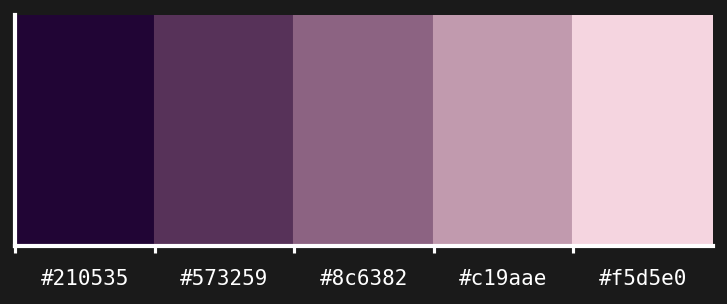

In [82]:
color_palette = ['#210535', '#573259', '#8c6382', '#c19aae', '#f5d5e0']
fig, ax = plt.subplots(figsize=(6, 2), dpi=150)
for idx, color in enumerate(color_palette):
  ax.add_patch(plt.Rectangle((idx, 0), 1, 1, color=color))
  ax.text(idx + 0.5, -0.1, color_palette[idx], ha='center', va='top', fontsize=10)
ax.set_xlim(0, len(color_palette))
ax.set_ylim(0, 1)
ax.set_xticks(range(len(color_palette)))
ax.set_xticklabels([])
ax.set_yticks([])
plt.show()

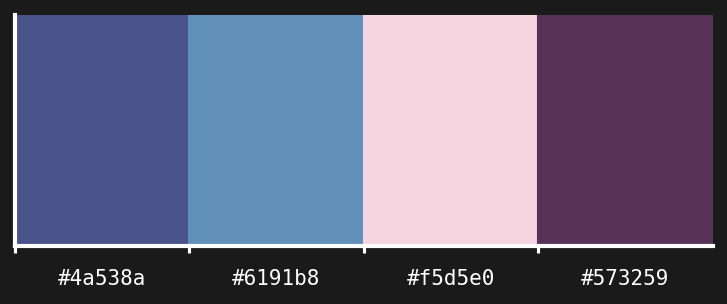

In [83]:
kmeans_palette = [ "#4a538a","#6191b8","#f5d5e0","#573259"]

fig, ax = plt.subplots(figsize=(6, 2), dpi=150)
for idx, color in enumerate(kmeans_palette):
  ax.add_patch(plt.Rectangle((idx, 0), 1, 1, color=color))
  ax.text(idx + 0.5, -0.1, kmeans_palette[idx], ha='center', va='top', fontsize=10)
ax.set_xlim(0, len(kmeans_palette))
ax.set_ylim(0, 1)
ax.set_xticks(range(len(kmeans_palette)))
ax.set_xticklabels([])
ax.set_yticks([])
plt.show()

### **Quick upload - Full and reduced**

#### **Full exoplanet data**
Removed duplicate names, update column names, outlier removals:

In [84]:
#exoplanet_data_raw = load_data(nasa_url, local_path)
exoplanet_data_raw = pd.read_csv(local_path)
column_renames = {
      "pl_name": "planet_name",
      "sy_dist": "distance_pc",
      "pl_rade": "planet_radius",
      "pl_masse": "planet_mass",
      "disc_year": "discovery_year",
      "discoverymethod": "discovery_method"
      }
exoplanet_data_full = rename_columns(exoplanet_data_raw, column_renames)
exoplanet_data_full = exoplanet_data_full.drop_duplicates(subset=['planet_name'])

# Outlier corrections according to NASA
exoplanet_data_full.loc[exoplanet_data_full['planet_name'] == 'Kepler-230 b', 'planet_radius'] = 4.17
exoplanet_data_full.loc[exoplanet_data_full['planet_name'] == 'Kepler-1946 b', 'planet_radius'] = 2.43
exoplanet_data_full.loc[exoplanet_data_full['planet_name'] == 'Kepler-444 f', 'planet_radius'] = 0.741
exoplanet_data_full.loc[exoplanet_data_full['planet_name'] == 'Kepler-444 d', 'planet_radius'] = 0.53
exoplanet_data_full.loc[exoplanet_data_full['planet_name'] == 'Kepler-57 c', 'planet_radius'] = 1.55
exoplanet_data_full.loc[exoplanet_data_full['planet_name'] == 'HAT-P-54-b', 'planet_radius'] = 10.36
exoplanet_data_full.loc[exoplanet_data_full['planet_name'] == 'Kepler-141 c', 'planet_radius'] = 1.41
exoplanet_data_full.loc[exoplanet_data_full['planet_name'] == 'Kepler-359 d', 'planet_radius'] = 3.93
exoplanet_data_full.loc[exoplanet_data_full['planet_name'] == 'HAT-P-63 b', 'distance_ly'] = 910
exoplanet_data_full = exoplanet_data_full.reset_index(drop=True)

In [85]:
exoplanet_data_full.reset_index(drop=True)

,planet_name,planet_radius,planet_mass,discovery_year,discovery_method,distance_ly
0,OGLE-TR-10 b,14.011,197.04600,2004,Transit,4384.602200
1,BD-08 2823 b,NaN,NaN,2009,Radial Velocity,134.749492
2,BD-08 2823 c,NaN,NaN,2009,Radial Velocity,134.749492
3,HR 8799 c,13.000,3000.00000,2008,Imaging,134.455766
4,HD 104985 b,NaN,NaN,2003,Radial Velocity,327.877760
...,...,...,...,...,...,...
5673,K2-368 d,1.948,NaN,2022,Transit,673.542080
5674,TOI-532 b,5.820,61.50000,2021,Transit,440.253220
5675,KMT-2017-BLG-2509L b,NaN,664.26137,2021,Microlensing,22950.400000
5676,OGLE-2017-BLG-1099L b,NaN,959.84179,2021,Microlensing,23635.000000


#### **Reduced exoplanet data**
Reduced dataset with exclusively data holding both planet mass and radius are recorded - 482 planets.

In [86]:
exoplanet_data_reduced = exoplanet_data_full.dropna()
# 'HAT-P-63 b' extreme outlier removal
exoplanet_data_reduced = exoplanet_data_reduced[exoplanet_data_reduced['planet_name'] != 'HD 100546 b']

# **2. Data upload**

### **Exoplanet Data**

We're grabbing data from [NASA exoplanets archive](https://exoplanetarchive.ipac.caltech.edu/index.html). The archive is a collaboration between the California Institute of Technology (Caltech) and NASA under the Exoplanet Exploration Program. We are drawing from the **Planetary Systems** dataset, which provides in depth data on every confirmed exoplanet known to astronomists to date. The Table contains one row per planet per reference and collects data such as its radius and mass, distance, stellar systems.

From the [parameter table documentation](https://exoplanetarchive.ipac.caltech.edu/docs/API_PS_columns.html) for this dataset I chose a small set of values from the dataset that are likely to be of biggest immediate interest:

*   `pl_name`: Planet name
*   `sy_dist`: Distance [pc] (Distance to the planetary system in units of parsecs)
*   `pl_rade`: Planet Radius [Earth Radius]
*   `pl_masse`: Planet Mass [Earth Mass]

### **Exoplanet Query**

To query this data we generate the industry standard **Table Access Protocol (TAP)** which uses **AQDL (Astronomical Query Data Language)** - akin to SQL for astronomical databases - to write queries.

*   Use Python's `requests` package to access NASA data using TAP protocol. I've written a short SQL (technically AQDL) queries which paired with `requests` grabs these columns:

```
          SELECT pl_name, sy_dist, pl_rade,pl_masse
          FROM ps
```
To fit it into a [TAP protocol](https://exoplanetarchive.ipac.caltech.edu/docs/TAP/usingTAP.html) we simply need to make a few adjustments such as remove additional spacing, add `+` between the major SQL statements. Full procedure:

*   Write data as a CSV into MyDrive.
*   Call CSV into notebook.

In [87]:
nasa_url = "https://exoplanetarchive.ipac.caltech.edu/TAP/sync?query=select+pl_name,sy_dist,pl_rade,pl_masse,disc_year,discoverymethod+from+ps&format=csv"
local_path = "/content/gdrive/MyDrive/exoplanet_data.csv"

exoplanet_data_raw = load_data(nasa_url, local_path)

#### **Column renaming and cleaning**

We can make a few adjustments to the data. We can replace columns and delete duplicate entries:

In [88]:
exoplanet_data_raw = exoplanet_data_raw.rename(
    columns = {
      "pl_name": "planet_name",
      "sy_dist": "distance_pc",
      "pl_rade": "planet_radius",
      "pl_masse": "planet_mass",
      "disc_year": "discovery_year",
      "discoverymethod": "discovery_method"
      })
exoplanet_data_raw = exoplanet_data_raw.drop_duplicates(subset=['planet_name'])

We notice now that our table has been significantly reduced in size (from 35k to 5k) without duplicates.

# **3. Exploratory Data Analysis**

Now that we've obtained our data can perform some preliminary EDA:

In [89]:
exoplanet_data_raw.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5678 entries, 0 to 36009
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   planet_name       5678 non-null   object 
 1   distance_pc       5544 non-null   float64
 2   planet_radius     3272 non-null   float64
 3   planet_mass       953 non-null    float64
 4   discovery_year    5678 non-null   int64  
 5   discovery_method  5678 non-null   object 
dtypes: float64(3), int64(1), object(2)
memory usage: 310.5+ KB


In [90]:
exoplanet_data_raw.head()

,planet_name,distance_pc,planet_radius,planet_mass,discovery_year,discovery_method
0,OGLE-TR-10 b,1344.9700,14.011,197.046,2004,Transit
1,BD-08 2823 b,41.3342,NaN,NaN,2009,Radial Velocity
2,BD-08 2823 c,41.3342,NaN,NaN,2009,Radial Velocity
3,HR 8799 c,41.2441,13.000,3000.000,2008,Imaging
4,HD 104985 b,100.5760,NaN,NaN,2003,Radial Velocity


In [91]:
exoplanet_data_raw.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5678 entries, 0 to 36009
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   planet_name       5678 non-null   object 
 1   distance_pc       5544 non-null   float64
 2   planet_radius     3272 non-null   float64
 3   planet_mass       953 non-null    float64
 4   discovery_year    5678 non-null   int64  
 5   discovery_method  5678 non-null   object 
dtypes: float64(3), int64(1), object(2)
memory usage: 310.5+ KB


#### **Outlier observation**

**Radius outliers** - Some of the highest values of radius appear to be suspiciously large.

In [92]:
print("Largest exoplanets")
exoplanet_data_raw.sort_values(by="planet_radius", ascending=False).head(10)

Largest exoplanets


,planet_name,distance_pc,planet_radius,planet_mass,discovery_year,discovery_method
15207,Kepler-230 b,740.7540,3791.050,NaN,2014,Transit
9518,Kepler-1946 b,1002.1200,3163.540,NaN,2021,Transit
5826,Kepler-444 f,36.4396,90.810,NaN,2015,Transit
4582,HD 100546 b,109.6770,77.342,2701.54146,2014,Imaging
5824,Kepler-444 d,36.4396,69.820,NaN,2015,Transit
756,Kepler-57 c,644.1400,48.420,NaN,2012,Transit
1421,HAT-P-54 b,143.6510,40.000,NaN,2015,Transit
1042,Kepler-24 e,1156.8100,38.671,NaN,2014,Transit
15416,Kepler-141 c,301.1830,37.400,NaN,2014,Transit
19790,Kepler-359 d,1443.2100,34.820,NaN,2014,Transit


We must adjust the outlier planets with their proper radius:
* 'Kepler-230 b': 4.17
* 'Kepler-1946 b': 2.43
* 'Kepler-444 f': 0.741
* 'Kepler-444 d': 0.53
* 'Kepler-57 c': 1.55
* 'HAT-P-54-b': 10.36
* 'Kepler-141 c': 1.41
* 'Kepler-359 d': 3.93

**HD 100546**, though large - 77.34x Earth radius - is accurate [HD 100546](https://science.nasa.gov/exoplanet-catalog/hd-100546-b/). Looking at the table once more our results are more sensible. HD 100546 b	is by many sources listed as the exoplanet with the biggest known radius.


In [93]:
print("Smallest exoplanets")
exoplanet_data_raw.sort_values(by="planet_radius", ascending=True).head(5)

Smallest exoplanets


,planet_name,distance_pc,planet_radius,planet_mass,discovery_year,discovery_method
5620,Kepler-37 b,63.9207,0.31,NaN,2013,Transit
5625,Kepler-37 e,63.9207,0.37,NaN,2014,Transit Timing Variations
4330,Kepler-444 c,36.4396,0.39,NaN,2015,Transit
4541,Kepler-444 e,36.4396,0.42,NaN,2015,Transit
14369,KOI-4777.01,172.2450,0.42,NaN,2014,Transit


**Mass outliers** - Does not appear to be any significant outliers. HR 2562 b is the largest recorded exoplanet with a whooping

In [94]:
print("Heaviest exoplanets")
exoplanet_data_raw.sort_values(by="planet_mass", ascending=False).head(10)

Heaviest exoplanets


,planet_name,distance_pc,planet_radius,planet_mass,discovery_year,discovery_method
7320,HD 125390 b,153.6470,NaN,10806.16584,2019,Radial Velocity
3531,KMT-2018-BLG-0885L b,6890.0000,NaN,9852.68062,2023,Microlensing
4832,HR 2562 b,34.0071,12.442,9534.90000,2016,Imaging
7351,HD 188641 b,64.3399,NaN,9333.03117,2022,Radial Velocity
4575,HD 217786 b,55.4847,NaN,9185.24096,2011,Radial Velocity
5630,DENIS-P J082303.1-491201 b,NaN,NaN,9057.77000,2013,Astrometry
7321,HD 26161 b,40.9128,NaN,9045.39646,2021,Radial Velocity
3982,HD 284149 AB b,117.8070,NaN,8981.83078,2017,Imaging
6847,HD 206893 b,40.7583,14.011,8899.19540,2021,Imaging
1442,2MASS J11011926-7732383 b,NaN,NaN,8899.19540,2024,Imaging


In [95]:
print("Lightest exoplanets")
exoplanet_data_raw.sort_values(by="planet_mass", ascending=True).head(5)

Lightest exoplanets


,planet_name,distance_pc,planet_radius,planet_mass,discovery_year,discovery_method
5723,LHS 1678 b,19.8782,0.696,0.350,2021,Transit
2511,Kepler-138 e,66.8624,NaN,0.430,2022,Transit Timing Variations
33122,KOI-55 b,1231.0200,0.759,0.440,2011,Orbital Brightness Modulation
80,HD 23472 d,39.0341,0.750,0.550,2022,Transit
33499,KOI-55 c,1231.0200,0.867,0.655,2011,Orbital Brightness Modulation


**Distance outliers** - one single outlier

In [96]:
print("Furthest exoplanets")
exoplanet_data_raw.sort_values(by="distance_pc", ascending = False).head(5)

Furthest exoplanets


,planet_name,distance_pc,planet_radius,planet_mass,discovery_year,discovery_method
20809,MOA-2011-BLG-291L b,8600.0,NaN,18.00000,2018,Microlensing
7002,KMT-2021-BLG-1077L c,8240.0,NaN,79.45710,2022,Microlensing
7000,KMT-2021-BLG-1077L b,8240.0,NaN,69.92225,2022,Microlensing
21392,OGLE-2015-BLG-0051L b,8200.0,NaN,230.00000,2016,Microlensing
5737,OGLE-2016-BLG-1093L b,8120.0,NaN,225.65817,2022,Microlensing


We create a final iteration of the data removing outliers.

In [97]:
#exoplanet_data_raw = load_data(nasa_url, local_path)
exoplanet_data_raw = pd.read_csv(local_path)
column_renames = {
      "pl_name": "planet_name",
      "sy_dist": "distance_pc",
      "pl_rade": "planet_radius",
      "pl_masse": "planet_mass",
      "disc_year": "discovery_year",
      "discoverymethod": "discovery_method"
      }
exoplanet_data_full = rename_columns(exoplanet_data_raw, column_renames)
exoplanet_data_full = exoplanet_data_full.drop_duplicates(subset=['planet_name'])

# Outlier corrections according to NASA
exoplanet_data_full.loc[exoplanet_data_full['planet_name'] == 'Kepler-230 b', 'planet_radius'] = 4.17
exoplanet_data_full.loc[exoplanet_data_full['planet_name'] == 'Kepler-1946 b', 'planet_radius'] = 2.43
exoplanet_data_full.loc[exoplanet_data_full['planet_name'] == 'Kepler-444 f', 'planet_radius'] = 0.741
exoplanet_data_full.loc[exoplanet_data_full['planet_name'] == 'Kepler-444 d', 'planet_radius'] = 0.53
exoplanet_data_full.loc[exoplanet_data_full['planet_name'] == 'Kepler-57 c', 'planet_radius'] = 1.55
exoplanet_data_full.loc[exoplanet_data_full['planet_name'] == 'HAT-P-54-b', 'planet_radius'] = 10.36
exoplanet_data_full.loc[exoplanet_data_full['planet_name'] == 'Kepler-141 c', 'planet_radius'] = 1.41
exoplanet_data_full.loc[exoplanet_data_full['planet_name'] == 'Kepler-359 d', 'planet_radius'] = 3.93
exoplanet_data_full.loc[exoplanet_data_full['planet_name'] == 'HAT-P-63 b', 'distance_ly'] = 910
exoplanet_data_full = exoplanet_data_full.reset_index(drop=True)

In [98]:
exoplanet_data_full.sort_values(by='planet_radius',ascending=False).head(10)

,planet_name,planet_radius,planet_mass,discovery_year,discovery_method,distance_ly
1147,HD 100546 b,77.342,2701.54146,2014,Imaging,357.54702
608,HAT-P-54 b,40.000,NaN,2015,Transit,468.30226
528,Kepler-24 e,38.671,NaN,2014,Transit,3771.20060
4787,GQ Lup b,33.600,6356.00000,2004,Imaging,492.81094
1759,Kepler-419 b,30.640,NaN,2014,Transit,3297.03360
5458,PDS 70 b,30.488,953.49000,2018,Imaging,368.58864
5454,CT Cha b,24.660,5403.00000,2007,Imaging,621.74720
574,WASP-79 b,23.430,286.03000,2012,Transit,804.20940
4634,Kepler-1520 b,22.950,NaN,2016,Transit,1981.80942
3367,PDS 70 c,22.866,635.66000,2019,Imaging,368.58864


# **4. K-means**

### **K-means Pre-processing**

We create a reduced variant of the data for k-means clustering.

In [99]:
exoplanet_data_reduced = exoplanet_data_full.dropna()
# 'HAT-P-63 b' extreme outlier removal
exoplanet_data_reduced = exoplanet_data_reduced[exoplanet_data_reduced['planet_name'] != 'HD 100546 b']

Select for radius and mass columns, perform imputation and standardization.

In [100]:
# Standardization - We are using a traditional standardization making the mean 0 and std 1
scaler = StandardScaler()
exoplanet_scaled =scaler.fit_transform(exoplanet_data_reduced[['planet_radius', 'planet_mass']])

print("First few rows of scaled data:")
print(exoplanet_scaled[:5])

First few rows of scaled data:
[[ 0.80464611 -0.24846984]
 [ 0.63590162  2.36069381]
 [ 0.59751266 -0.11446852]
 [-0.91467832 -0.41625401]
 [-1.22863321 -0.41141353]]


### **Silhouette score analysis**

Silhouette scores allow yo uto determine how effective the kmeans algorithm is at grouping similar data points together. In a silhouette analysis we compare different numbers of categorizations and choose the highest silhouette score.

Silhouette scores range from -1 to 1. The higher the score, the better the clustering.

Clearly kmeans on 3 or 4 clusters appear to be most effective.

### **Apply Kmeans with `n_clusters=4`**

In [101]:
kmeans = KMeans(n_clusters = 4, n_init = 40)
kmeans.fit(exoplanet_scaled)
clusters = kmeans.predict(exoplanet_scaled)

centroids_scaled = kmeans.cluster_centers_
print("Centroids in scaled data:")
print(centroids_scaled)

centroids_original_scale = scaler.inverse_transform(centroids_scaled)
print("Centroids in original scale:")
print(centroids_original_scale)

Centroids in scaled data:
[[-1.00822196 -0.38785049]
 [ 0.75949015 -0.07350959]
 [ 1.42840403  6.04710676]
 [ 0.79104641  2.09943928]]
Centroids in original scale:
[[3.14955140e+00 4.73131322e+01]
 [1.37404568e+01 3.85001072e+02]
 [1.77481250e+01 6.96021382e+03]
 [1.39295200e+01 2.71934132e+03]]


In [102]:
clusters

array([1, 3, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 3,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1,
       1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 3, 3, 0, 0, 0, 1,
       0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1,
       1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1,
       0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0,
       0, 1, 1, 0, 0, 0, 3, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0,
       0, 0, 1, 0, 0, 1, 0, 1, 0, 3, 0, 0, 1, 0, 3, 3, 0, 1, 1, 1, 1, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 2, 0, 0, 0,
       0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0,
       1, 0, 1, 3, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0,

In [103]:
exoplanet_data_reduced.loc[:,'cluster'] = clusters + 1
exoplanet_data_reduced

,planet_name,planet_radius,planet_mass,discovery_year,discovery_method,distance_ly,cluster
0,OGLE-TR-10 b,14.011,197.04600,2004,Transit,4384.602200,2
3,HR 8799 c,13.000,3000.00000,2008,Imaging,134.455766,4
22,WASP-47 b,12.770,341.00000,2012,Transit,863.182800,2
24,WASP-47 d,3.710,16.80000,2015,Transit,863.182800,1
25,WASP-47 e,1.829,22.00000,2015,Transit,863.182800,1
...,...,...,...,...,...,...,...
5648,EPIC 249893012 d,3.940,10.18000,2020,Transit,1047.424960,1
5650,NGTS-15 b,12.330,238.68913,2021,Transit,2563.941100,2
5651,NGTS-17 b,13.899,242.82090,2021,Transit,3391.312800,2
5652,NGTS-16 b,14.572,211.99155,2021,Transit,2928.027680,2


In [104]:
clusters, centroids_original_scale = perform_kmeans(exoplanet_data_reduced, kmeans_columns, n_clusters, n_init)
exoplanet_data_reduced.loc[:,'cluster'] = clusters + 1

### **Cluster analysis**

Observing averages for each cluster:

In [105]:
cluster_averages = exoplanet_data_reduced.groupby('cluster')[['planet_mass', 'planet_radius']].mean().reset_index()

# Display the result
cluster_averages

,cluster,planet_mass,planet_radius
0,1,385.001072,13.740457
1,2,47.313132,3.149551
2,3,6960.213819,17.748125
3,4,2719.341317,13.929520


Observing minimums for each cluster:

In [106]:
exoplanet_data_reduced.groupby('cluster')[['planet_mass', 'planet_radius']].min().reset_index()

,cluster,planet_mass,planet_radius
0,1,25.1000,8.597
1,2,0.3500,0.696
2,3,5403.0000,11.777
3,4,1595.4986,10.424


Observing maximums for each cluster:

In [107]:
exoplanet_data_reduced.groupby('cluster')[['planet_mass', 'planet_radius']].max().reset_index()

,cluster,planet_mass,planet_radius
0,1,1462.01067,30.488
1,2,1652.70772,8.564
2,3,9534.90000,33.600
3,4,4767.42610,21.590


In [108]:
exoplanet_data_processed = exoplanet_data_reduced

# **5. Graphs**

Graphs include:

*   Graph A and B (defunct)
*   Graph C - Description dataset
*   Graph D - Distance from Earth (histogram)
*   Graph E - Distance from Earth (CDF)
*   Graph F - Mass v. Radius (silhouette)
*   Graph G - Silhouette Scores
*   Graph H - Exoplanet mass vs. radius and clusters (semi-log scatterplot)
*   Graph I - 3D projection - distance, mass, radius
*   Graph J - Discovery methods stacked histogram

#### **Graph C - Description dataset**

In [109]:
exoplanet_data_full_describe = return_describe_table(exoplanet_data_full)
exoplanet_data_full_describe = exoplanet_data_full_describe.rename(index={
      "distance_ly":"Distance (ly)",
      "planet_radius":"Radius",
      "planet_mass":"Mass",
      "discovery_year":"Discovery Year",
      })

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

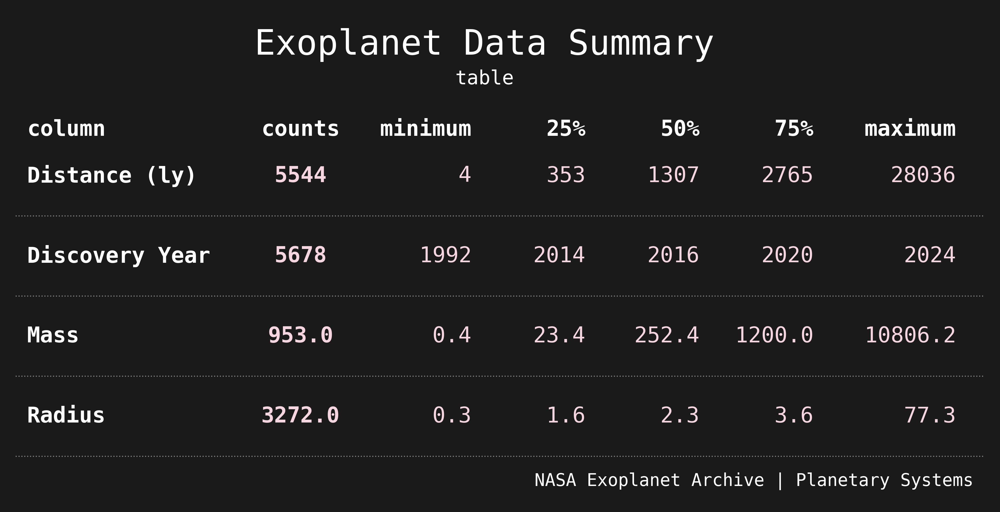

In [110]:
# Define data, rows and columns
rows = exoplanet_data_full_describe.shape[0]
cols = exoplanet_data_full_describe.shape[1]  # Removing 'std', so no need to add 1

data = [{'attribute': index,
         'counts': exoplanet_data_full_describe.loc[index, 'count'],
         'minimum': exoplanet_data_full_describe.loc[index, 'min'],
         '25%': exoplanet_data_full_describe.loc[index, '25%'],
         '50%': exoplanet_data_full_describe.loc[index, '50%'],
         '75%': exoplanet_data_full_describe.loc[index, '75%'],
         'maximum': exoplanet_data_full_describe.loc[index, 'max']} for index in exoplanet_data_full_describe.index]

# Figures and Axes
fig, ax = plt.subplots(figsize=(8, 4))
fig.suptitle('Exoplanet Data Summary', x=0.5, y=0.86, fontsize=16)
fig.text(0.54, 0.12, "NASA Exoplanet Archive | Planetary Systems", ha='left', va='bottom', fontsize=8)
fig.text(0.5, 0.77, "table", ha='center', fontsize=9)
ax.set_ylim(-1, rows + 1)
ax.set_xlim(0, cols + .5)

# Column labels plot
ax.text(0.1, 3.5, 'column', weight='bold', ha='left')
ax.text(2.5, 3.5, 'counts', weight='bold', ha='center')
ax.text(4, 3.5, 'minimum', weight='bold', ha='right')
ax.text(5, 3.5, '25%', weight='bold', ha='right')
ax.text(6, 3.5, '50%', weight='bold', ha='right')
ax.text(7, 3.5, '75%', weight='bold', ha='right')
ax.text(8.25, 3.5, 'maximum', weight='bold', ha='right')

# Rows plot
for row in range(rows):
    d = data[row]

    ax.text(x=0.1, y=row, s=d['attribute'], va='center', ha='left', weight='bold')
    ax.text(x=2.5, y=row, s=d['counts'], color=color_palette[4], va='center', ha='center', weight='bold')
    ax.text(x=4, y=row, s=d['minimum'], color=color_palette[4], va='center', ha='right')
    ax.text(x=5, y=row, s=d['25%'], color=color_palette[4], va='center', ha='right')
    ax.text(x=6, y=row, s=d['50%'], color=color_palette[4], va='center', ha='right')
    ax.text(x=7, y=row, s=d['75%'], color=color_palette[4], va='center', ha='right')
    ax.text(x=8.25, y=row, s=d['maximum'], color=color_palette[4], va='center', ha='right')

ax.axis('off')
for row in range(rows):
    ax.plot(
        [0, cols + 1],
        [row - .5, row - .5],
        ls=':',
        lw='.5',
        c='grey'
    )

# Aspect ratios, save plot and/or show plot
if aspect:
    width_in, height_in = scatter.fig.get_size_inches()
    aspect_ratios.loc[2] = ["Graph C", width_in * scatter.fig.dpi, height_in * scatter.fig.dpi]

if save:
    plt.savefig("2024-05-24-exoplanets-C.svg", bbox_inches='tight')
    files.download("2024-05-24-exoplanets-C.svg")
else:
    plt.show()

#### **Graph D and E - Distances table**

In [111]:
exoplanet_data_distances = exoplanet_data_full.drop_duplicates(subset=['planet_name'])['distance_ly']
exoplanet_data_distances = exoplanet_data_distances[exoplanet_data_distances.notna()].reset_index(drop=True)

#### **Graph D: Distance from Earth (lollipop plot)**

In [112]:
# Data preparation
counts, bin_edges = np.histogram(exoplanet_data_distances, bins=250)
bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])

# Color map
cmap = LinearSegmentedColormap.from_list("my_gradient", ["#573259", "#f5d5e0"])
norm = plt.Normalize(counts.min(), counts.max())

# Figure
fig, ax = plt.subplots(figsize=(10, 6))
fig.dpi = 2000
fig.text(0.45, 0.86, "lollipop plot", fontsize=10)
fig.text(0.67, 0, "NASA Exoplanet Archive | Planetary Systems", ha='left', va='bottom', fontsize=8)

# Plot lollipops
for count, bin_center in zip(counts, bin_centers):
    ax.vlines(x=bin_center, ymin=0, ymax=count, color=cmap(norm(count)), alpha=1, linewidth=1.2)
    if count > 0:  # remove white dots for bins with no planets
        ax.scatter(bin_center, count, color='white', s=4, zorder=4)

# Axis settings
ax.set_xlabel('Distance from Earth', fontsize=10, labelpad=7)
fig.text(0.46, 0.015,"light years", fontsize=7)
ax.set_xlim(left=-150,right=9000)
ax.set_ylabel('Exoplanet Count', fontsize=10, labelpad=9)
ax.set_ylim(bottom=-2)
ax.set_aspect('auto')
ax.grid(False)
ax.set_title('Exoplanet Distance from Earth', fontsize=20)
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)


# Axes colorbar and ticks
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
ticks = [0, 125, 250, 375, 500]  # Adjust ticks based on your data
cbar = plt.colorbar(sm, cax=cax, ticks=ticks)
cbar.set_label('Bin count', fontsize=10)

# Aspect ratios, save plot and/or show plot
if aspect == True:
    width_in, height_in = scatter.fig.get_size_inches()
    aspect_ratios.loc[3] = ["Graph D", width_in * scatter.fig.dpi, height_in * scatter.fig.dpi]
if save:
    plt.savefig("2024-05-24-exoplanets-D.svg", bbox_inches='tight')
    files.download("2024-05-24-exoplanets-D.svg")
else:
    plt.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### **Graph E: Distance from Earth (CDF)**

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

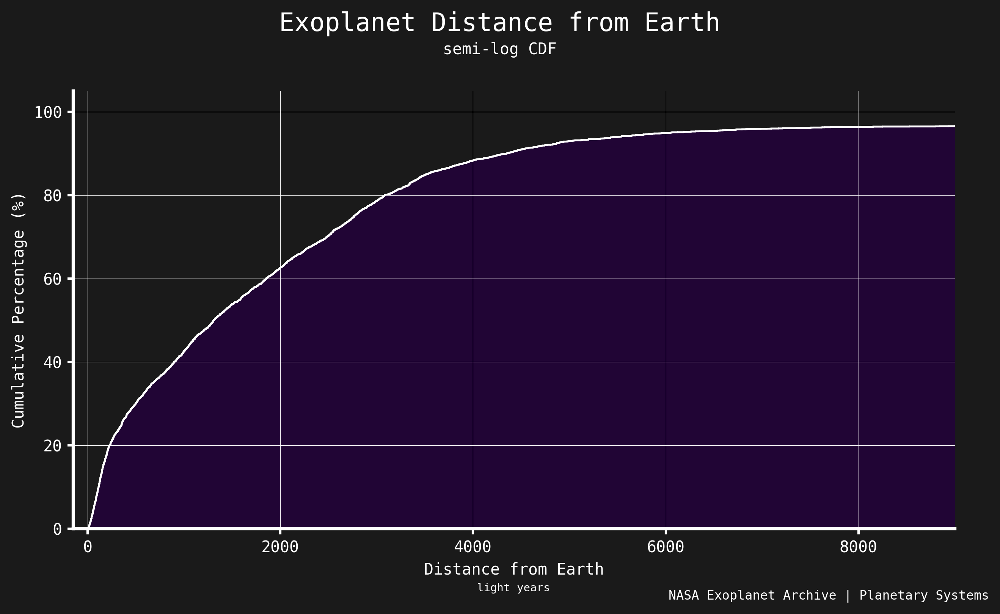

In [113]:
# Figure
fig, ax = plt.subplots(figsize=(10, 5))
fig.dpi = 300
fig.suptitle('Exoplanet Distance from Earth', fontsize=16, y=1.02)
fig.text(0.45, 0.945,"semi-log CDF", fontsize=10)
fig.text(0.93, -0.02, "NASA Exoplanet Archive | Planetary Systems", ha='right', va='bottom', fontsize=8)

# Cumulative plot
sorted_distances = np.sort(exoplanet_data_distances)
cumulative_counts = np.arange(1, len(sorted_distances) + 1)
total_exoplanets = len(sorted_distances)
cumulative_percentage = (cumulative_counts / total_exoplanets) * 100
ax.step(sorted_distances, cumulative_percentage, where='post', color='white', linestyle='-', linewidth=1.2)
ax.fill_between(sorted_distances, cumulative_percentage, step='post', color="#210535", alpha=1)

# Axis
ax.set_xlabel('Distance from Earth', fontsize=10)
fig.text(0.48, 0,"light years", fontsize=7)
ax.set_ylabel('Cumulative Percentage (%)', fontsize=10)

ax.set_xlim(left=-150,right=9000)
ax.set_ylim(bottom=0)

#ax.set_xscale('log')
ax.grid(True, which='major', linestyle='-', linewidth=0.25, color='w')
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)

# Aspect ratios, save plot and/or show plot

#width_in, height_in = fig.get_size_inches()
#aspect_ratios.loc[4] = ["Graph E", width_in * fig.dpi, height_in * fig.dpi]
if save == True:
  plt.savefig("2024-05-24-exoplanets-E.svg", bbox_inches = 'tight')
  files.download("2024-05-24-exoplanets-E.svg")
else:
  plt.show()

#### **Graph F - Exoplanet mass vs. radius (semi-log scatterplot)**

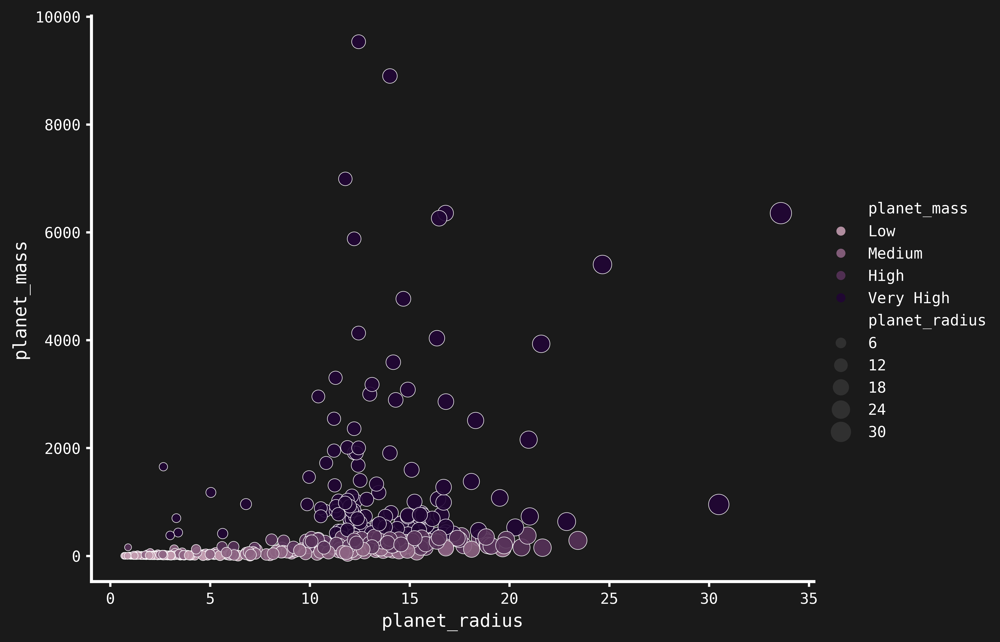

In [114]:
# Obtain handle and label from scatterplot. A bit of a makeshift solution for getting the legend I wanted.

mass_bins = pd.qcut(exoplanet_data_processed['planet_mass'], q=4, labels=["Low", "Medium", "High", "Very High"])

# Scatterplot
scatter = sns.relplot(
            data=exoplanet_data_processed,
            x="planet_radius",
            y="planet_mass",
            hue=mass_bins,
            size="planet_radius",
            palette=color_palette[:4][::-1],
            sizes=(20, 200),
            kind='scatter',
            legend='brief',
            height=6,
            aspect=1.3,
            alpha=0.9
        )
handle_1, label_1 = scatter.ax.get_legend_handles_labels()
label_1[0] = 'Mass'
label_1[5] = 'Radius'

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

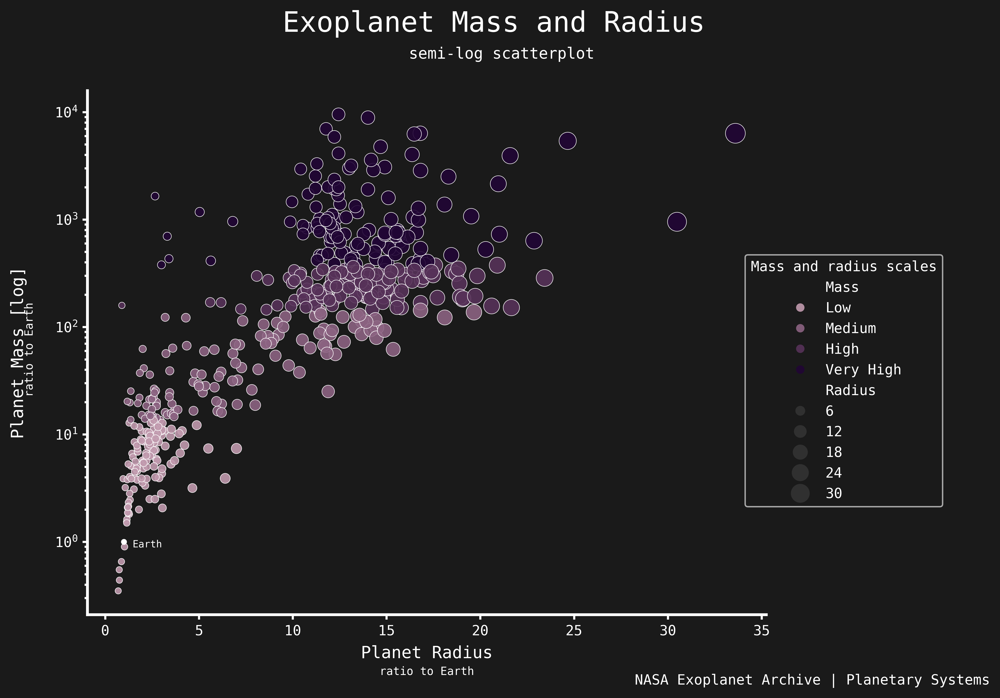

In [115]:
# Binning the planet mass
mass_bins = pd.qcut(exoplanet_data_processed['planet_mass'], q=4, labels=["Low", "Medium", "High", "Very High"])

# Scatterplot
scatter = sns.relplot(
            data=exoplanet_data_processed,
            x="planet_radius",
            y="planet_mass",
            hue=mass_bins,
            size="planet_radius",
            palette=color_palette[:4][::-1],
            sizes=(20, 200),
            kind='scatter',
            legend=False,
            height=6,
            aspect=1.3,
            alpha=0.9
        )

# Figure
scatter.fig.tight_layout()
scatter.fig.suptitle('Exoplanet Mass and Radius', fontsize=20, x=0.63,y=1.1)
scatter.fig.text(0.64, 1.02, "semi-log scatterplot", ha="center", fontsize=11)
scatter.fig.text(1.26, -0.02, "NASA Exoplanet Archive | Planetary Systems", ha='right', va='bottom',fontsize=10)

# Axes
for ax in scatter.axes.flat:
    ax.set_yscale('log')
    ax.grid(False)
ax = scatter.axes.flat[0]
ax.set_xlabel('Planet Radius', fontsize=12, labelpad=5)
ax.annotate('ratio to Earth', xy=(0.5, -0.115), xycoords='axes fraction', ha='center', fontsize=8)
ax.set_ylabel('Planet Mass [log]', fontsize=12, labelpad=20)
ax.annotate('ratio to Earth', xy=(-0.085, 0.42), xycoords='axes fraction', ha='center', fontsize=8, rotation=90)

# Annotate Earth
ax.scatter(1, 1, c='white', marker='o', s=10, label='Earth')
ax.annotate('Earth', xy=(1.5, 1.2), xytext=(10, -10),
            textcoords='offset points', ha='center', fontsize=7, color='white')

# Legend
edge_color_patch = mpatches.Patch(edgecolor='white', facecolor='none', label='Edge color')
scatter.ax.legend(handles=handle_1, labels=label_1, title="Mass and radius scales", loc='best', bbox_to_anchor=(1.27, 0.7))

# Aspect ratios, save plot and/or show plot

if aspect == True:
    width_in, height_in = scatter.fig.get_size_inches()
    aspect_ratios.loc[5] = ["Graph F", width_in * scatter.fig.dpi, height_in * scatter.fig.dpi]
if save == True:
    plt.savefig("2024-05-24-exoplanets-F.svg", bbox_inches='tight')
    files.download("2024-05-24-exoplanets-F.svg")
else:
    plt.show()

#### **Graph G - Silhouette scores**

Comparison of silhouette scores with k-means clustering.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

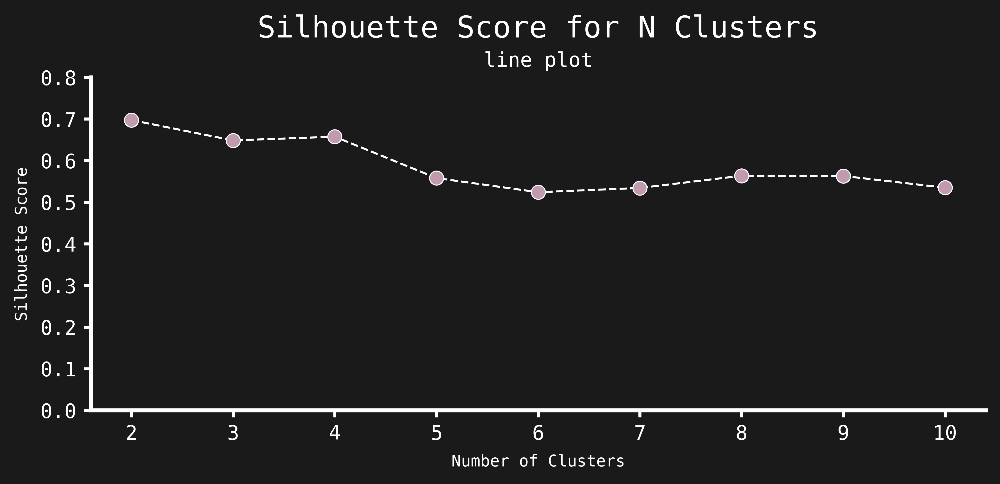

In [116]:
# Silhouette scores generation
silhouette_scores = []
cluster_range = range(2, 11)
for n_clusters in cluster_range:
    scaler = StandardScaler()
    exoplanet_scaled =scaler.fit_transform(exoplanet_data_reduced[kmeans_columns])
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++', n_init='auto', random_state=42)
    cluster_labels = kmeans.fit_predict(exoplanet_scaled)
    silhouette_avg = silhouette_score(exoplanet_scaled, cluster_labels)
    silhouette_scores.append(silhouette_avg)

# Plotting silhouette scores
fig, ax = plt.subplots(figsize=(8, 3))
ax.plot(cluster_range, silhouette_scores, marker='o', markersize=7, linestyle='--', linewidth=1, markerfacecolor=color_palette[3], markeredgewidth=0.5, color='white')
ax.set_title('Silhouette Score for N Clusters', pad=20)
ax.text(0.5, 1.02, "line plot", ha='center', va='bottom', fontsize=10, transform=ax.transAxes)
ax.set_xlabel('Number of Clusters', fontsize=8, labelpad=5)
ax.set_ylabel('Silhouette Score', fontsize=8, labelpad=5)
ax.set_ylim(0,0.8)

# Aspect ratios, save plot and/or show plot
if aspect == True:
    width_in, height_in = scatter.fig.get_size_inches()
    aspect_ratios.loc[6] = ["Graph G", width_in * scatter.fig.dpi, height_in * scatter.fig.dpi]
if save == True:
  plt.savefig("2024-05-24-exoplanets-G.svg", bbox_inches = 'tight')
  files.download("2024-05-24-exoplanets-G.svg")
else:
  plt.show()

Simple scatterplot comparing radius and mass. We notice that actually the semi-log/lin-log plot comparing mass and radius generates a linear like. General positive correlation.

There is a higher density of planets with radii between 1 and 10 Earth radii and masses between 1 and 100 Earth masses.

#### **Graph H - Exoplanet mass vs. radius and clusters (semi-log scatterplot)**

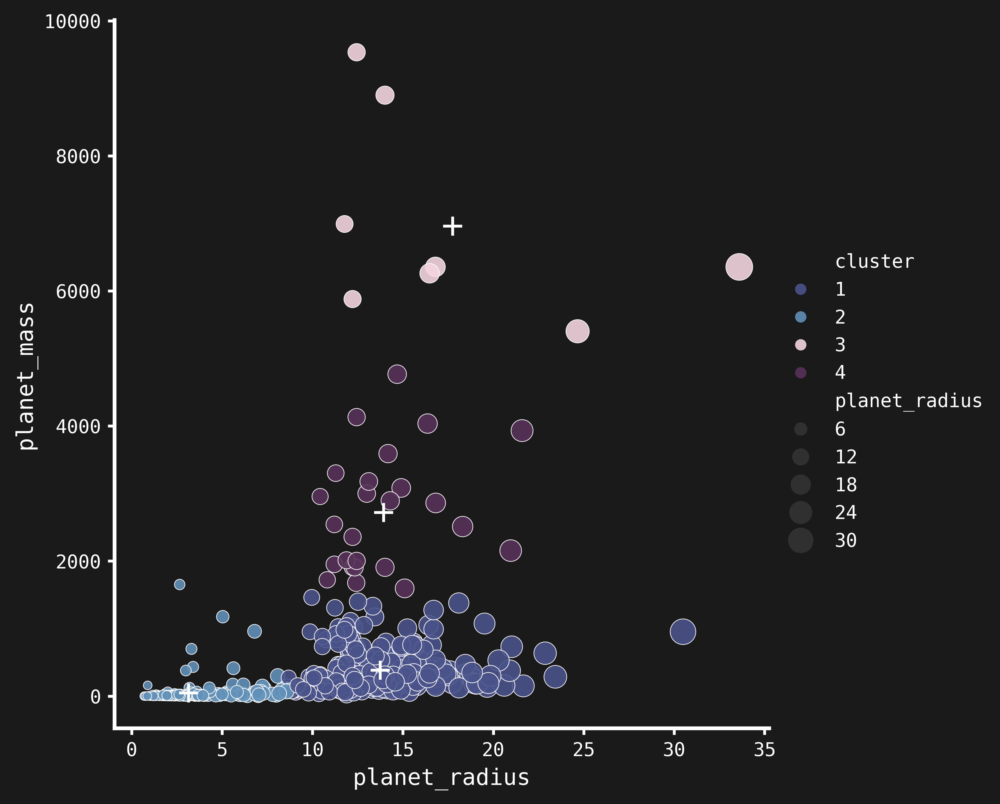

In [117]:
# Obtain handle and label from scatterplot. A bit of a wonky solution for getting the legend I wanted.

scatter = sns.relplot(data=exoplanet_data_processed,x="planet_radius",y="planet_mass",hue='cluster',size="planet_radius",palette= kmeans_palette, sizes=(20, 200), kind='scatter', legend='brief', height=6, aspect=1, alpha=0.9)
plt.scatter(centroids_original_scale[:, 0], centroids_original_scale[:, 1], c='white', marker='+', s=100, label='Centroids')
handle, label = scatter.ax.get_legend_handles_labels()
label[0] = 'Cluster'
label[5] = 'Radius'

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

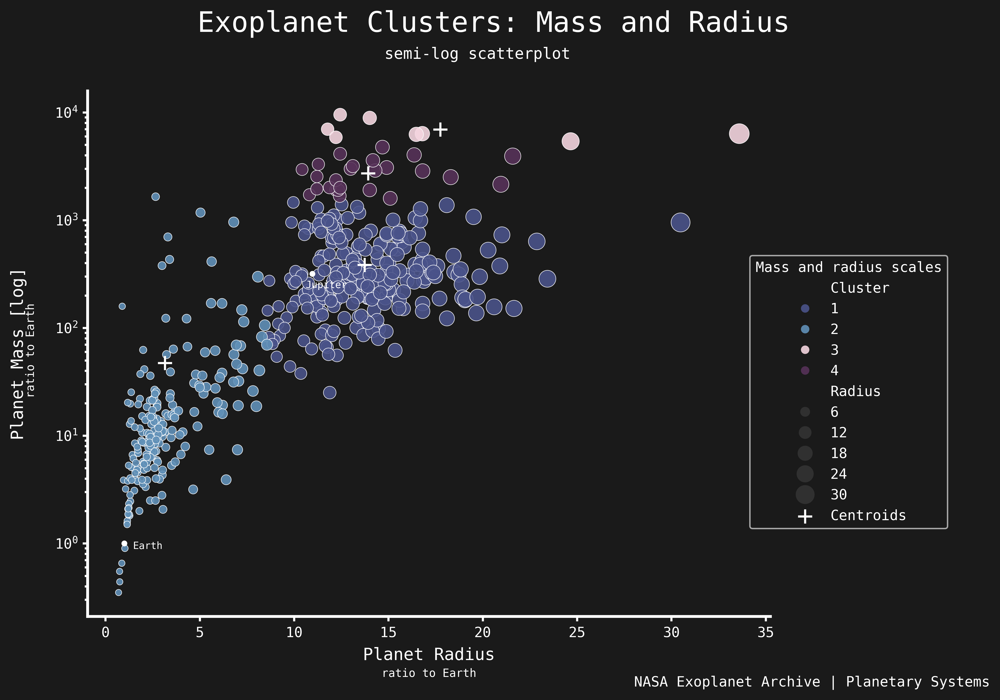

In [118]:
# Scatterplot
scatter = sns.relplot(
            data=exoplanet_data_processed,
            x="planet_radius",
            y="planet_mass",
            hue='cluster',
            size="planet_radius",
            palette= kmeans_palette,
            sizes=(20, 200),
            kind='scatter',
            legend=False,
            height=6,
            aspect=1.34,
            alpha=0.9
        )

# Cluster centroids
plt.scatter(centroids_original_scale[:, 0], centroids_original_scale[:, 1], c='white', marker='+', s=100, label='Centroids')

# Figure
scatter.fig.tight_layout()
scatter.fig.subplots_adjust(right=.95)
scatter.fig.suptitle('Exoplanet Clusters: Mass and Radius', fontsize=20, x=0.61, y=1.1)
scatter.fig.text(0.63-0.04, 1.02,"semi-log scatterplot", ha="center", fontsize=11)
scatter.fig.text(1.22, -0.02, "NASA Exoplanet Archive | Planetary Systems", ha='right', va='bottom',fontsize=10)

# Axes
for ax in scatter.axes.flat:
    ax.set_yscale('log')
    ax.grid(False)
ax = scatter.axes.flat[0]
ax.set_xlabel('Planet Radius', fontsize=12, labelpad=5)
ax.annotate('ratio to Earth', xy=(0.5, -0.115), xycoords='axes fraction', ha='center', fontsize=8)
ax.set_ylabel('Planet Mass [log]', fontsize=12, labelpad=20)
ax.annotate('ratio to Earth', xy=(-0.083, 0.42), xycoords='axes fraction', ha='center', fontsize=8, rotation=90)
y_limit = ax.get_ylim()
x_limit = ax.get_xlim()

# Earth and Jupiter
ax.scatter(1, 1, c='white',  marker='o', s=10, label='Earth')
ax.annotate('Earth', xy=(1.5, 1.2), xytext=(10, -10),
            textcoords='offset points', ha='center', fontsize=7, color='white')
ax.scatter(10.97, 317.8, c='white', marker='o', s=10, label='Jupiter')
ax.annotate('Jupiter', xy=(10.97, 317.8), xytext=(10, -10),
            textcoords='offset points', ha='center', fontsize=7, color='white')

# Legend
edge_color_patch = mpatches.Patch(edgecolor='white', facecolor='none', label='Edge color')
scatter.ax.legend(handles=handle, labels=label, title="Mass and radius scales", loc='best', bbox_to_anchor=(1.27, 0.7))

# Aspect ratios, save plot and/or show plot
if aspect == True:
    width_in, height_in = scatter.fig.get_size_inches()
    aspect_ratios.loc[7] = ["Graph H", width_in * scatter.fig.dpi, height_in * scatter.fig.dpi]
if save == True:
  plt.savefig("2024-05-24-exoplanets-H.svg", bbox_inches = 'tight')
  files.download("2024-05-24-exoplanets-H.svg")
else:
  plt.show()

In [119]:
save=True

<ipython-input-120-d914f56036c4>:4: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  scatter = sns.relplot(


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

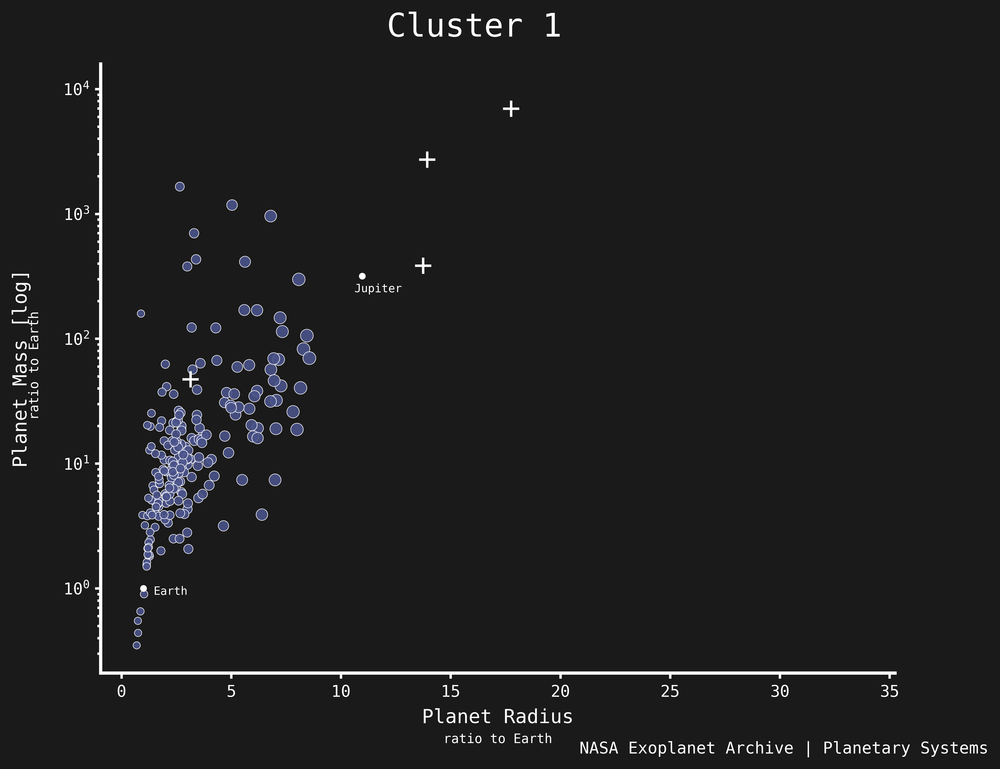

In [120]:
# Scatter
max_radius = exoplanet_data_processed['planet_radius'].max()

scatter = sns.relplot(
            data=exoplanet_data_processed[exoplanet_data_processed['cluster']==2],
            x="planet_radius",
            y="planet_mass",
            color='#4a538a',
            size=exoplanet_data_processed['planet_radius'] / max_radius,
            palette= kmeans_palette,
            sizes=(20, 200),
            kind='scatter',
            legend=False,
            height=6,
            aspect=1.34,
            alpha=0.9
        )

# Centroids
plt.scatter(centroids_original_scale[:, 0], centroids_original_scale[:, 1], c='white', marker='+', s=100, label='Centroids')

# Figure
scatter.fig.tight_layout()
scatter.fig.subplots_adjust(right=.95)
scatter.fig.suptitle('Cluster 1', fontsize=20, y=1.05)
scatter.fig.text(1.05, -0.02, "NASA Exoplanet Archive | Planetary Systems", ha='right', va='bottom',fontsize=10)

# Axes
for ax in scatter.axes.flat:
    ax.set_yscale('log')
    ax.grid(False)

ax = scatter.axes.flat[0]
ax.set_xlabel('Planet Radius', fontsize=12, labelpad=5)
ax.annotate('ratio to Earth', xy=(0.5, -0.115), xycoords='axes fraction', ha='center', fontsize=8)
ax.set_xlim(x_limit)
ax.set_ylim(y_limit)

ax.set_ylabel('Planet Mass [log]', fontsize=12, labelpad=20)
ax.annotate('ratio to Earth', xy=(-0.083, 0.42), xycoords='axes fraction', ha='center', fontsize=8, rotation=90)

ax.scatter(1, 1, c='white',  marker='o', s=10, label='Earth')
ax.annotate('Earth', xy=(1.5, 1.2), xytext=(10, -10),
            textcoords='offset points', ha='center', fontsize=7, color='white')
ax.scatter(10.97, 317.8, c='white', marker='o', s=10, label='Jupiter')
ax.annotate('Jupiter', xy=(10.97, 317.8), xytext=(10, -10),
            textcoords='offset points', ha='center', fontsize=7, color='white')

# Aspect ratios, save plot and/or show plot
if aspect == True:
    width_in, height_in = scatter.fig.get_size_inches()
    aspect_ratios.loc[7] = ["Graph H", width_in * scatter.fig.dpi, height_in * scatter.fig.dpi]
if save == True:
  plt.savefig("2024-05-24-exoplanets-H1.svg", bbox_inches = 'tight')
  files.download("2024-05-24-exoplanets-H1.svg")
else:
  plt.show()

<ipython-input-121-be04e9d9289e>:4: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  scatter = sns.relplot(


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

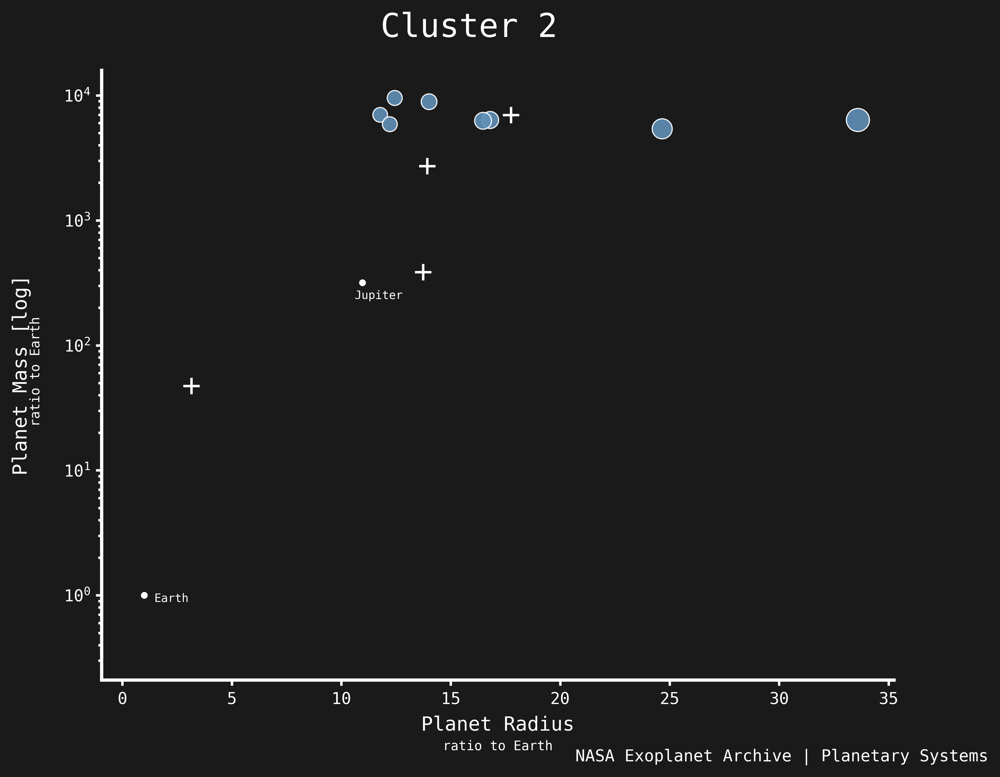

In [121]:
# Scatter
max_radius = exoplanet_data_processed['planet_radius'].max()

scatter = sns.relplot(
            data=exoplanet_data_processed[exoplanet_data_processed['cluster']==3],
            x="planet_radius",
            y="planet_mass",
            color='#6191b8',
            size=exoplanet_data_processed['planet_radius'] / max_radius,
            palette= kmeans_palette,
            sizes=(20, 200),
            kind='scatter',
            legend=False,
            height=6,
            aspect=1.34,
            alpha=0.9
        )

# Centroids
plt.scatter(centroids_original_scale[:, 0], centroids_original_scale[:, 1], c='white', marker='+', s=100, label='Centroids')

# Figure
scatter.fig.tight_layout()
scatter.fig.subplots_adjust(right=.95)
scatter.fig.suptitle('Cluster 2', fontsize=20, y=1.05)
scatter.fig.text(1.05, -0.02, "NASA Exoplanet Archive | Planetary Systems", ha='right', va='bottom',fontsize=10)

# Axes
for ax in scatter.axes.flat:
    ax.set_yscale('log')
    ax.grid(False)

ax = scatter.axes.flat[0]
ax.set_xlabel('Planet Radius', fontsize=12, labelpad=5)
ax.annotate('ratio to Earth', xy=(0.5, -0.115), xycoords='axes fraction', ha='center', fontsize=8)
ax.set_xlim(x_limit)
ax.set_ylim(y_limit)

ax.set_ylabel('Planet Mass [log]', fontsize=12, labelpad=20)
ax.annotate('ratio to Earth', xy=(-0.083, 0.42), xycoords='axes fraction', ha='center', fontsize=8, rotation=90)

ax.scatter(1, 1, c='white',  marker='o', s=10, label='Earth')
ax.annotate('Earth', xy=(1.5, 1.2), xytext=(10, -10),
            textcoords='offset points', ha='center', fontsize=7, color='white')
ax.scatter(10.97, 317.8, c='white', marker='o', s=10, label='Jupiter')
ax.annotate('Jupiter', xy=(10.97, 317.8), xytext=(10, -10),
            textcoords='offset points', ha='center', fontsize=7, color='white')

# Aspect ratios, save plot and/or show plot
if aspect == True:
    width_in, height_in = scatter.fig.get_size_inches()
    aspect_ratios.loc[7] = ["Graph H", width_in * scatter.fig.dpi, height_in * scatter.fig.dpi]
if save == True:
  plt.savefig("2024-05-24-exoplanets-H2.svg", bbox_inches = 'tight')
  files.download("2024-05-24-exoplanets-H2.svg")
else:
  plt.show()

<ipython-input-122-6874bf82879d>:4: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  scatter = sns.relplot(


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

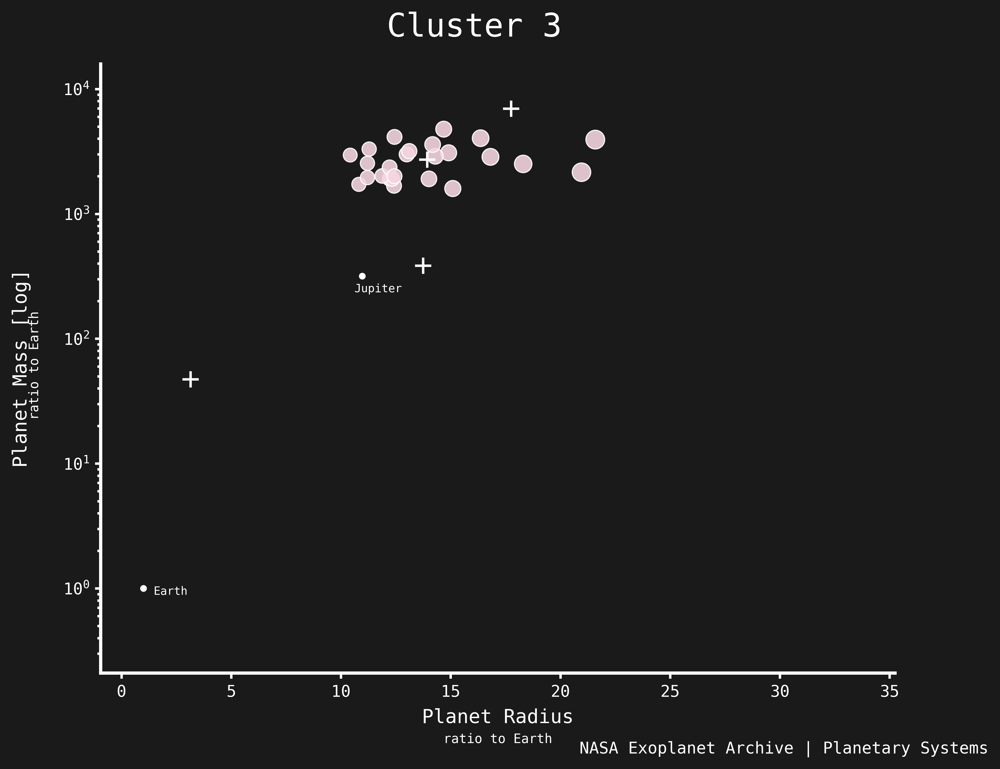

In [122]:
# Scatter
max_radius = exoplanet_data_processed['planet_radius'].max()

scatter = sns.relplot(
            data=exoplanet_data_processed[exoplanet_data_processed['cluster']==4],
            x="planet_radius",
            y="planet_mass",
            color='#f5d5e0',
            size=exoplanet_data_processed['planet_radius'] / max_radius,
            palette= kmeans_palette,
            sizes=(20, 200),
            kind='scatter',
            legend=False,
            height=6,
            aspect=1.34,
            alpha=0.9
        )

# Centroids
plt.scatter(centroids_original_scale[:, 0], centroids_original_scale[:, 1], c='white', marker='+', s=100, label='Centroids')

# Figure
scatter.fig.tight_layout()
scatter.fig.subplots_adjust(right=.95)
scatter.fig.suptitle('Cluster 3', fontsize=20, y=1.05)
scatter.fig.text(1.05, -0.02, "NASA Exoplanet Archive | Planetary Systems", ha='right', va='bottom',fontsize=10)

# Axes
for ax in scatter.axes.flat:
    ax.set_yscale('log')
    ax.grid(False)

ax = scatter.axes.flat[0]
ax.set_xlabel('Planet Radius', fontsize=12, labelpad=5)
ax.annotate('ratio to Earth', xy=(0.5, -0.115), xycoords='axes fraction', ha='center', fontsize=8)
ax.set_xlim(x_limit)
ax.set_ylim(y_limit)

ax.set_ylabel('Planet Mass [log]', fontsize=12, labelpad=20)
ax.annotate('ratio to Earth', xy=(-0.083, 0.42), xycoords='axes fraction', ha='center', fontsize=8, rotation=90)

ax.scatter(1, 1, c='white',  marker='o', s=10, label='Earth')
ax.annotate('Earth', xy=(1.5, 1.2), xytext=(10, -10),
            textcoords='offset points', ha='center', fontsize=7, color='white')
ax.scatter(10.97, 317.8, c='white', marker='o', s=10, label='Jupiter')
ax.annotate('Jupiter', xy=(10.97, 317.8), xytext=(10, -10),
            textcoords='offset points', ha='center', fontsize=7, color='white')

# Aspect ratios, save plot and/or show plot
if aspect == True:
    width_in, height_in = scatter.fig.get_size_inches()
    aspect_ratios.loc[7] = ["Graph H", width_in * scatter.fig.dpi, height_in * scatter.fig.dpi]
if save == True:
  plt.savefig("2024-05-24-exoplanets-H3.svg", bbox_inches = 'tight')
  files.download("2024-05-24-exoplanets-H3.svg")
else:
  plt.show()

<ipython-input-123-e639ff4d84bc>:4: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  scatter = sns.relplot(


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

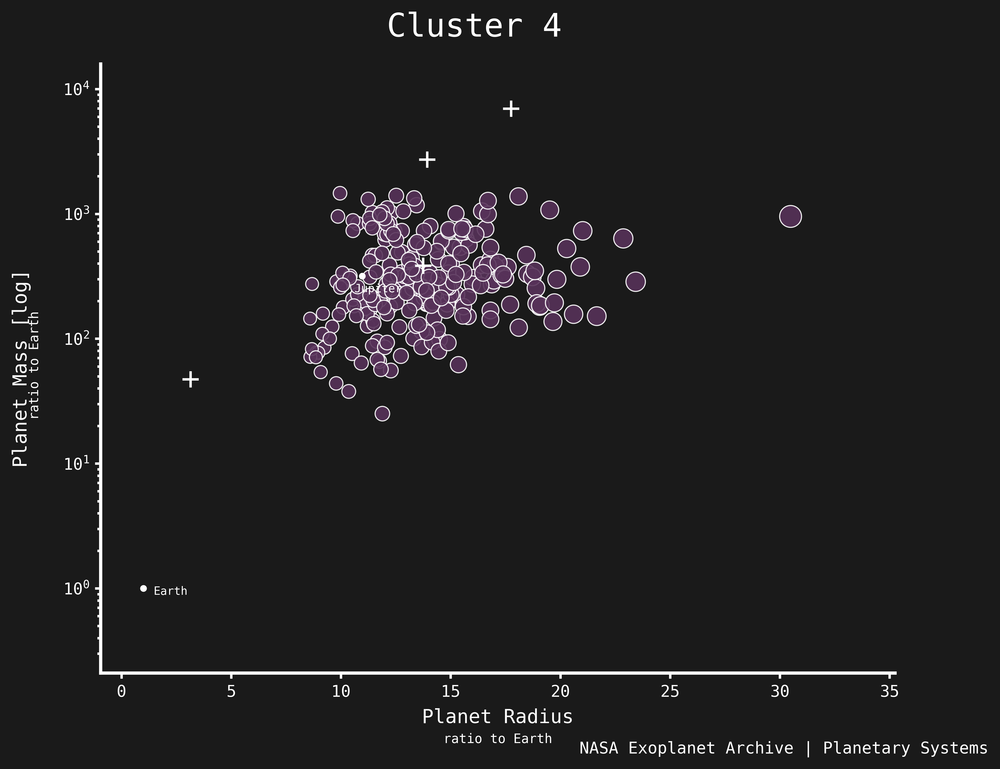

In [123]:
# Scatter
max_radius = exoplanet_data_processed['planet_radius'].max()

scatter = sns.relplot(
            data=exoplanet_data_processed[exoplanet_data_processed['cluster']==1],
            x="planet_radius",
            y="planet_mass",
            color='#573259',
            size=exoplanet_data_processed['planet_radius'] / max_radius,
            palette= kmeans_palette,
            sizes=(20, 200),
            kind='scatter',
            legend=False,
            height=6,
            aspect=1.34,
            alpha=0.9
        )

# Centroids
plt.scatter(centroids_original_scale[:, 0], centroids_original_scale[:, 1], c='white', marker='+', s=100, label='Centroids')

# Figure
scatter.fig.tight_layout()
scatter.fig.subplots_adjust(right=.95)
scatter.fig.suptitle('Cluster 4', fontsize=20, y=1.05)
scatter.fig.text(1.05, -0.02, "NASA Exoplanet Archive | Planetary Systems", ha='right', va='bottom',fontsize=10)

# Axes
for ax in scatter.axes.flat:
    ax.set_yscale('log')
    ax.grid(False)

ax = scatter.axes.flat[0]
ax.set_xlabel('Planet Radius', fontsize=12, labelpad=5)
ax.annotate('ratio to Earth', xy=(0.5, -0.115), xycoords='axes fraction', ha='center', fontsize=8)
ax.set_xlim(x_limit)
ax.set_ylim(y_limit)

ax.set_ylabel('Planet Mass [log]', fontsize=12, labelpad=20)
ax.annotate('ratio to Earth', xy=(-0.083, 0.42), xycoords='axes fraction', ha='center', fontsize=8, rotation=90)

ax.scatter(1, 1, c='white',  marker='o', s=10, label='Earth')
ax.annotate('Earth', xy=(1.5, 1.2), xytext=(10, -10),
            textcoords='offset points', ha='center', fontsize=7, color='white')
ax.scatter(10.97, 317.8, c='white', marker='o', s=10, label='Jupiter')
ax.annotate('Jupiter', xy=(10.97, 317.8), xytext=(10, -10),
            textcoords='offset points', ha='center', fontsize=7, color='white')

# Aspect ratios, save plot and/or show plot
if aspect == True:
    width_in, height_in = scatter.fig.get_size_inches()
    aspect_ratios.loc[7] = ["Graph H", width_in * scatter.fig.dpi, height_in * scatter.fig.dpi]
if save == True:
  plt.savefig("2024-05-24-exoplanets-H4.svg", bbox_inches = 'tight')
  files.download("2024-05-24-exoplanets-H4.svg")
else:
  plt.show()

#### **Graph I - 3D projection - distance, mass, radius**

<ipython-input-124-83a556f4ffa9>:30: MatplotlibDeprecationWarning: The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.
  ax.dist = 12


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

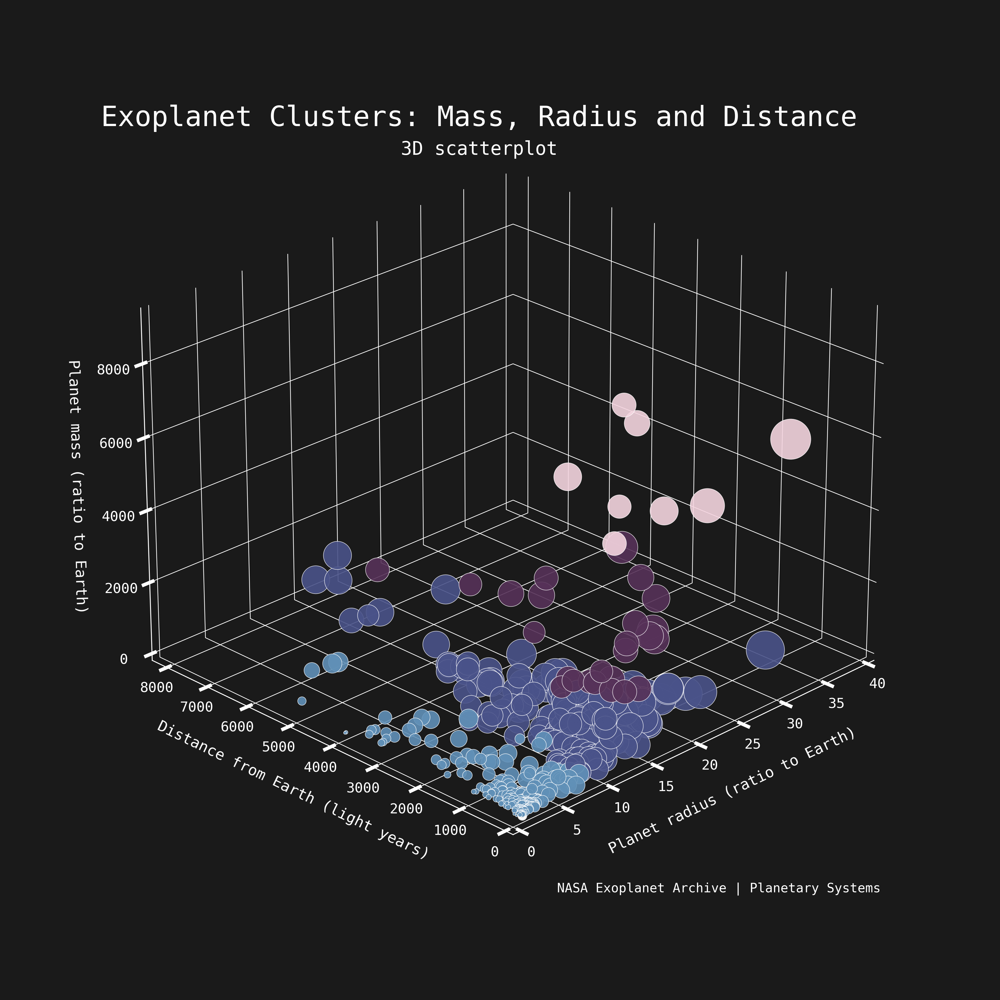

In [124]:
# Data for three-dimensional scattered points
xdata = exoplanet_data_processed['planet_radius']
ydata = exoplanet_data_processed['distance_ly']
zdata = exoplanet_data_processed['planet_mass']
hue = exoplanet_data_processed['cluster']
x_min = np.min(xdata)
x_max = np.max(xdata)
new_min = 1
new_max = 300
x_scaled = ((xdata - x_min) / (x_max - x_min)) * (new_max - new_min) + new_min

# Color map
custom_cmap = LinearSegmentedColormap.from_list("custom_cmap", kmeans_palette)

# Figure
fig = plt.figure(figsize=(10, 7.5))
fig.suptitle('Exoplanet Clusters: Mass, Radius and Distance', x=0.5, y=0.79+0.02,fontsize=12)
fig.text(0.5, 0.76+0.01,"3D scatterplot", ha="center", fontsize=8)
fig.text(0.74, 0.18, "NASA Exoplanet Archive | Planetary Systems", ha='right', va='bottom',fontsize=5.5)

# Axes
ax = plt.axes(projection='3d')
ax.xaxis._axinfo['grid'].update(color='w', linestyle='-', linewidth=0.3)
ax.yaxis._axinfo['grid'].update(color='w', linestyle='-', linewidth=0.3)
ax.zaxis._axinfo['grid'].update(color='w', linestyle='-', linewidth=0.3)
ax.set_xlabel('Planet radius (ratio to Earth)', labelpad=-2,fontsize = 6.5)
ax.set_ylabel('Distance from Earth (light years)', labelpad=-2,fontsize = 6.5)
ax.set_zlabel('Planet mass (ratio to Earth)', labelpad=-0.5, fontsize = 6.5)
ax.view_init(elev=25, azim=45)
ax.dist = 12
for spine in ax.spines.values():
    spine.set_linewidth(0.5)
ax.xaxis.line.set_lw(0.4)
ax.yaxis.line.set_lw(0.4)
ax.zaxis.line.set_lw(0.4)
ax.tick_params(axis='x', which='both', direction='in', length=6, width=0, pad=-2,colors='w', labelsize=6)
ax.tick_params(axis='y', which='both', direction='in', length=6, width=0.2, pad=-2,colors='w', labelsize=6)
ax.tick_params(axis='z', which='both', direction='in', length=6, width=0.2, pad=0.5, colors='w', labelsize=6)
ax.xaxis.set_pane_color((0,0,0,0))
ax.yaxis.set_pane_color((0,0,0,0))
ax.zaxis.set_pane_color((0,0,0,0))

ax.set_xlim3d(0, 40)
ax.set_ylim3d(0, 8200)
ax.set_zlim3d(0, 9300)
ax.invert_xaxis()
ax.invert_yaxis()

# 3D Scatterplot
ax.scatter3D(xdata, ydata, zdata, c=hue, cmap=custom_cmap, s=x_scaled, alpha = 0.9, edgecolor="white", linewidths=0.2)
ax.scatter3D(1, 0, 1, c='white', s=10,alpha = 0.9)

# Aspect ratios, save plot and/or show plot
if aspect == True:
    width_in, height_in = scatter.fig.get_size_inches()
    aspect_ratios.loc[8] = ["Graph I", width_in * scatter.fig.dpi, height_in * scatter.fig.dpi]
if save == True:
  plt.savefig("2024-05-24-exoplanets-I.png", bbox_inches = 'tight')
  files.download("2024-05-24-exoplanets-I.png")
else:
  plt.show()

We next track exoplanet distance from Earth. Unsurprisingly, the number of known exoplanets taper off with distance; limitations in measurement. Plotting a CDF of exolanet distance from Earth. Notice that close to 90% of known exoplanets are within the ten thousand light year range.

In [125]:
exoplanet_data_no_duplicates[exoplanet_data_no_duplicates['discovery_year']==1992]

NameError: name 'exoplanet_data_no_duplicates' is not defined

In [ ]:
discovery_data

#### **Graph J - Discovery methods stacked histogram**

In [ ]:
# Prepare data
discovery_data = exoplanet_data_full.groupby(['discovery_year', 'discovery_method']).size().reset_index(name='count')
method_counts = discovery_data.groupby('discovery_method', as_index=False)[['discovery_method', 'count']].sum('count').sort_values(by='count', ascending=False).reset_index(drop=True)[:3]
top_methods = method_counts['discovery_method'].tolist()
discovery_data.loc[discovery_data.query("discovery_method not in @top_methods").index, 'discovery_method'] = 'Other'
pivot_table = discovery_data.pivot_table(index='discovery_year', columns='discovery_method', values='count', aggfunc='sum').fillna(0).reset_index()
all_years = pd.DataFrame({'discovery_year': np.arange(1992, 2025)})
pivot_table = all_years.merge(pivot_table, on='discovery_year', how='left').fillna(0)
pivot_table = pivot_table.sort_values(by='discovery_year', ascending=False)
cumulative_pivot_table = pivot_table.copy()
for method in pivot_table.columns[1:]:
    cumulative_pivot_table[method] = pivot_table[method][::-1].cumsum()[::-1]

# Color palette
colors = ['#8c6382', "#4a538a", '#573259', '#311e3e'][::-1]

# Figure
fig, ax = plt.subplots(figsize=(12, 7))
fig.text(0.5, 0.88, "cumulative stacked histogram", ha='center', fontsize=11)
fig.text(0.07, 0, "NASA Exoplanet Archive | Planetary Systems", ha='left', va='bottom', fontsize=10)

# Bars
bottom = np.zeros(len(cumulative_pivot_table))
for i, method in enumerate(cumulative_pivot_table.columns[1:]):
    ax.bar(cumulative_pivot_table['discovery_year'], cumulative_pivot_table[method], label=method, bottom=bottom, color=colors[i % len(colors)], edgecolor='white')
    bottom += cumulative_pivot_table[method]

# Custom Legend
desired_legend_order = ['Transit', 'Radial Velocity', 'Microlensing', 'Other']
handles, labels = ax.get_legend_handles_labels()
ordered_handles = [handles[labels.index(method)] for method in desired_legend_order]
ax.legend(ordered_handles, desired_legend_order, title='Discovery Method')

# Axes
ax.set_xlabel('Discovery Year', labelpad=10)
ax.set_ylabel('Cumulative Discoveries', labelpad=10)
ax.set_xlim(1991.5, 2025)
ax.set_title('Exoplanet Discovery', fontsize=23, pad=15)
#ax.legend(title='Discovery Method') #bbox_to_anchor=(1.27, 0.7)
ax.grid(True, which='minor', linestyle='--', linewidth=0.5)
ax.set_xticks(cumulative_pivot_table['discovery_year'])
ax.set_xticklabels(cumulative_pivot_table['discovery_year'].astype(int), rotation=45)

# Aspect ratios, save plot and/or show plot
if aspect == True:
    width_in, height_in = scatter.fig.get_size_inches()
    aspect_ratios.loc[10] = ["Graph J", width_in * scatter.fig.dpi, height_in * scatter.fig.dpi]
if save == True:
  plt.savefig("2024-05-24-exoplanets-J.svg", bbox_inches = 'tight')
  files.download("2024-05-24-exoplanets-J.svg")
else:
  plt.show()